# Introduction to Deep Learning

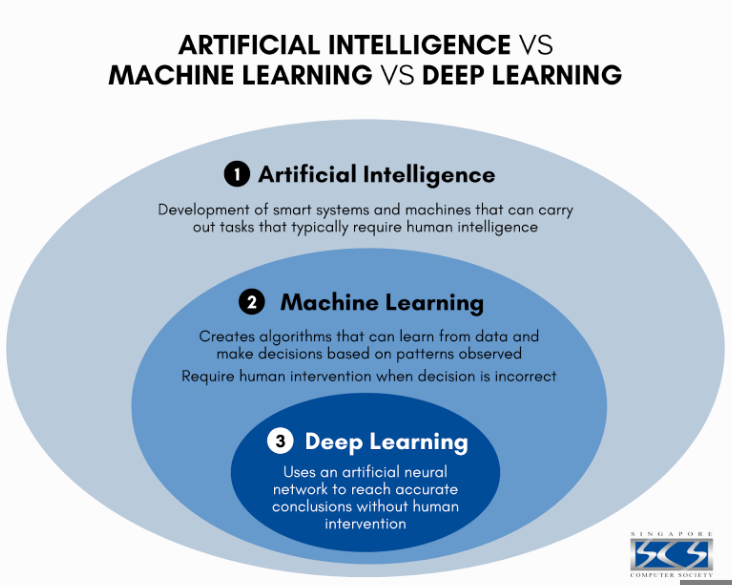

## Types of Machine Learning

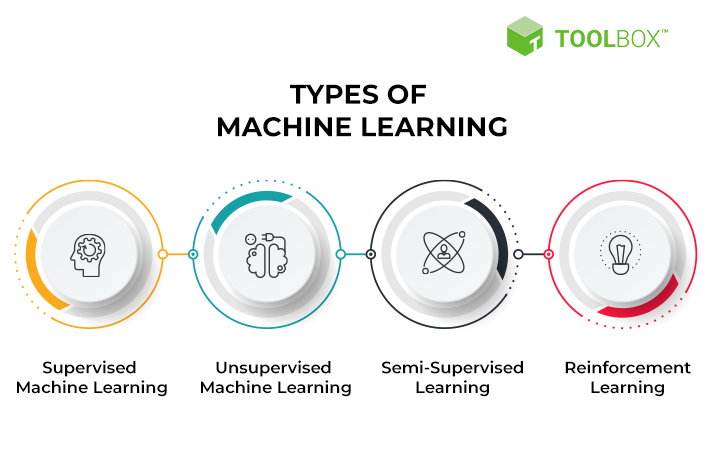

# How computers see images
- Computers see images as matrices of numbers <br>
- Each number in the matrix is called a pixel and it is encoded in 8 bits <br>
- That means each pixel can store values between 0 and 255 <br>
- 0 means black <br>
- 1 means white <br>

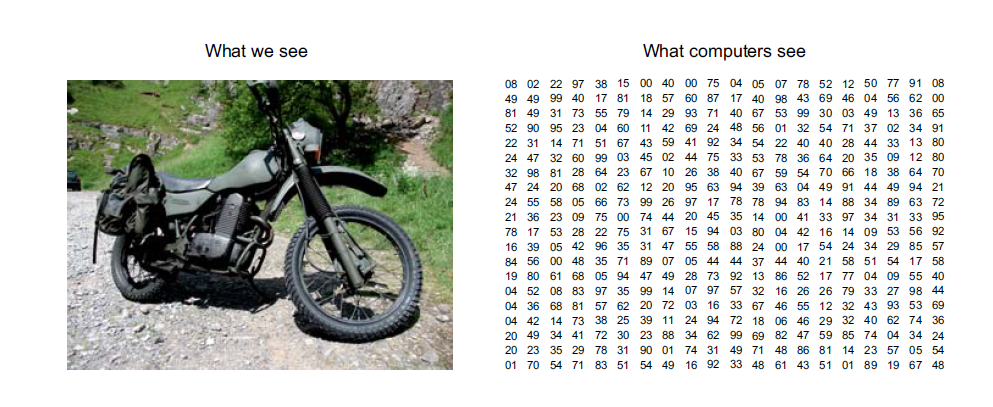

# Color Images
- Color images are represented by three matrices.
- The first matrix represents the `red` channel
- The second matrix represents the `blue` channel
- The third matrix represents the `green` channel

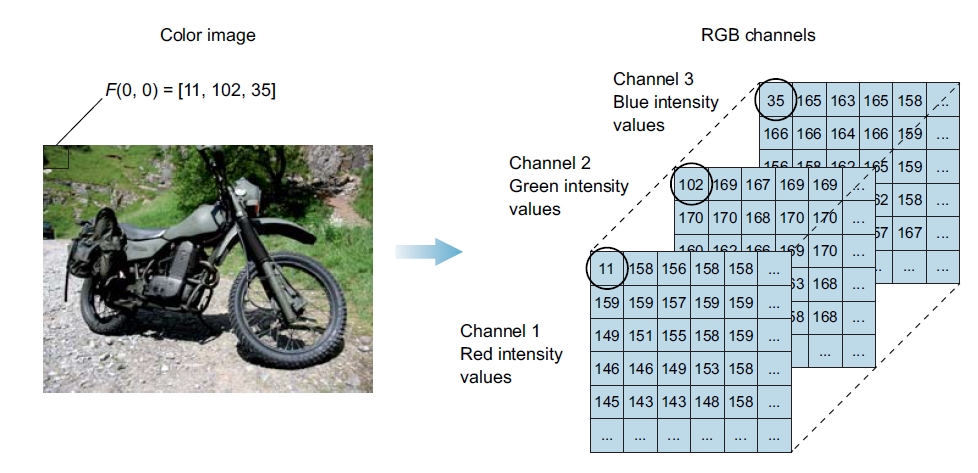

# Work flow for Machine Learning Projects

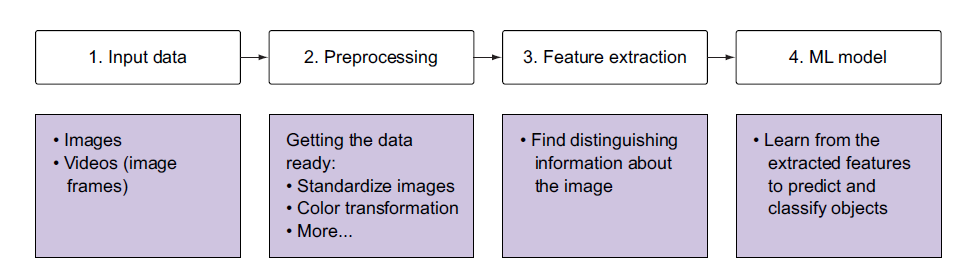

## Types of Neural Networks

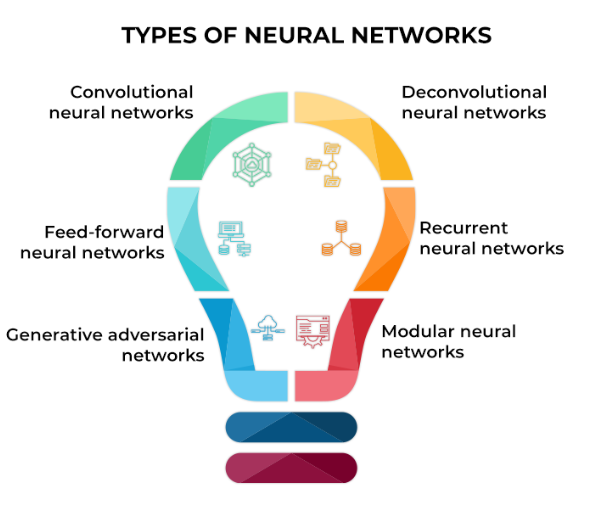

### Feed Forward Networks
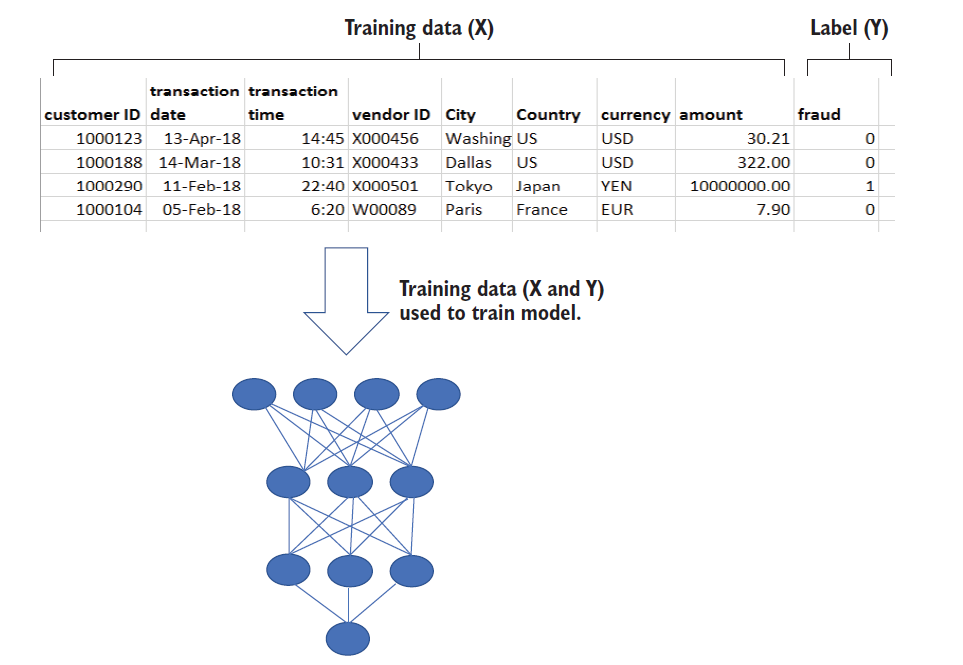

<video width="700" height="600" 
       src="NN.mp4"  
       controls>
</video>

### In this section, we are going to import the libraries we need to work on our project

In [1]:
import matplotlib.pyplot as plt    
import seaborn as sns
from utils import mnist_visual_test, mnist_confusion_matrix
from utils import show_samples, plot_fruit_images, show_confusion_matrix
import numpy as np                              
import tensorflow as tf                         
from keras.models import load_model, Model  
from keras.datasets import mnist
from keras.layers import Dense, Flatten, Conv2D, MaxPooling2D, Input, Rescaling   

# Classification of Hand Written Digits

### Load the mnist dataset and plot some of the images

In [3]:
(train_images, train_labels), (test_images, test_labels) = mnist.load_data()

### Let us plot some of the images

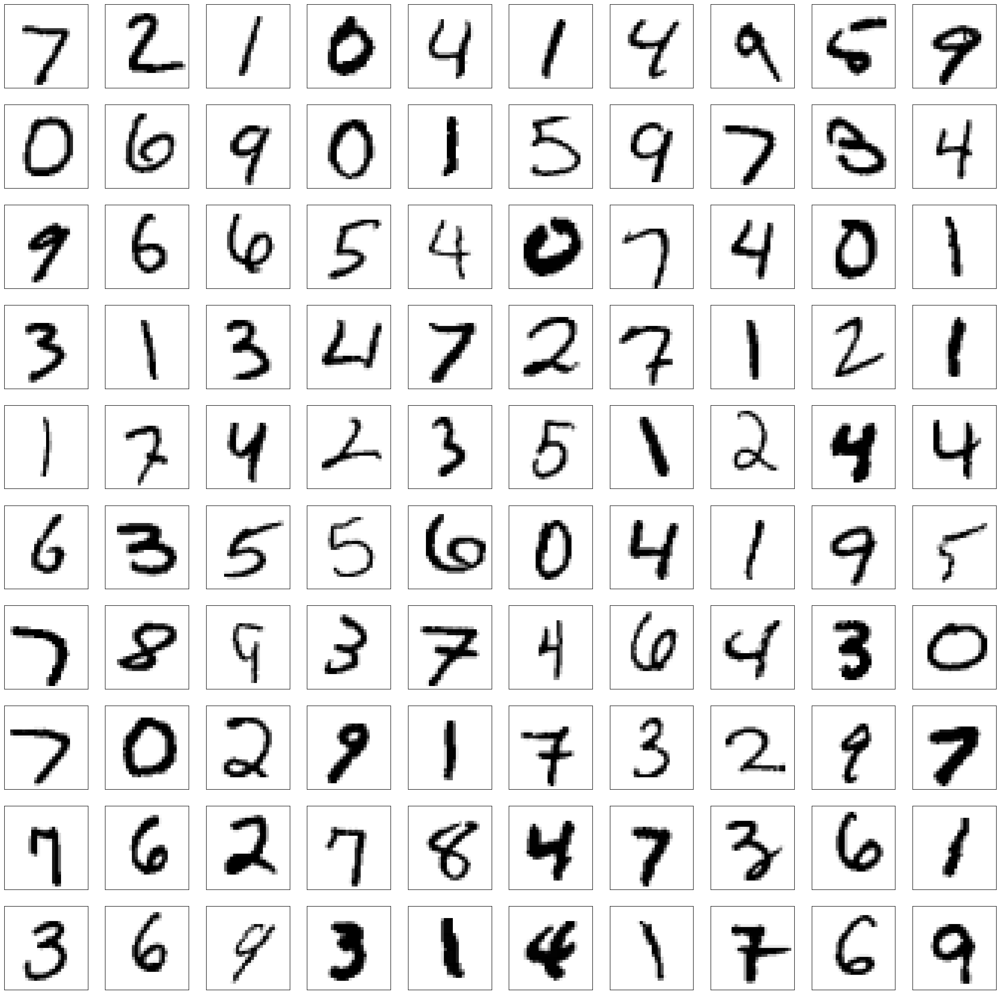

In [4]:
plt.figure(figsize=(30, 30))
for i in range(100):
    plt.subplot(10, 10, i+1)
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])
    pic = test_images[i] / 255
    plt.imshow(pic, cmap=plt.cm.binary)

### Define a feed forward network to classify hand written digits

In [5]:
inputs = Input(shape=(28, 28))
x = Rescaling(1/255)(inputs)
x = Flatten()(x)
x = Dense(units=16, activation='relu')(x)
x = Dense(units=16, activation='relu')(x)
outputs = Dense(units=10, activation='softmax')(x)

mnist_ff = Model(inputs=inputs, outputs=outputs)
mnist_ff.compile(loss="sparse_categorical_crossentropy", metrics=["accuracy"])
mnist_ff.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 28, 28)]          0         
                                                                 
 rescaling (Rescaling)       (None, 28, 28)            0         
                                                                 
 flatten (Flatten)           (None, 784)               0         
                                                                 
 dense (Dense)               (None, 16)                12560     
                                                                 
 dense_1 (Dense)             (None, 16)                272       
                                                                 
 dense_2 (Dense)             (None, 10)                170       
                                                                 
Total params: 13,002
Trainable params: 13,002
Non-trainable p

## Model Analysis before training

### Let us see our untrained network performs on our test data before training

13/13 [==============================] - 3s 3ms/step


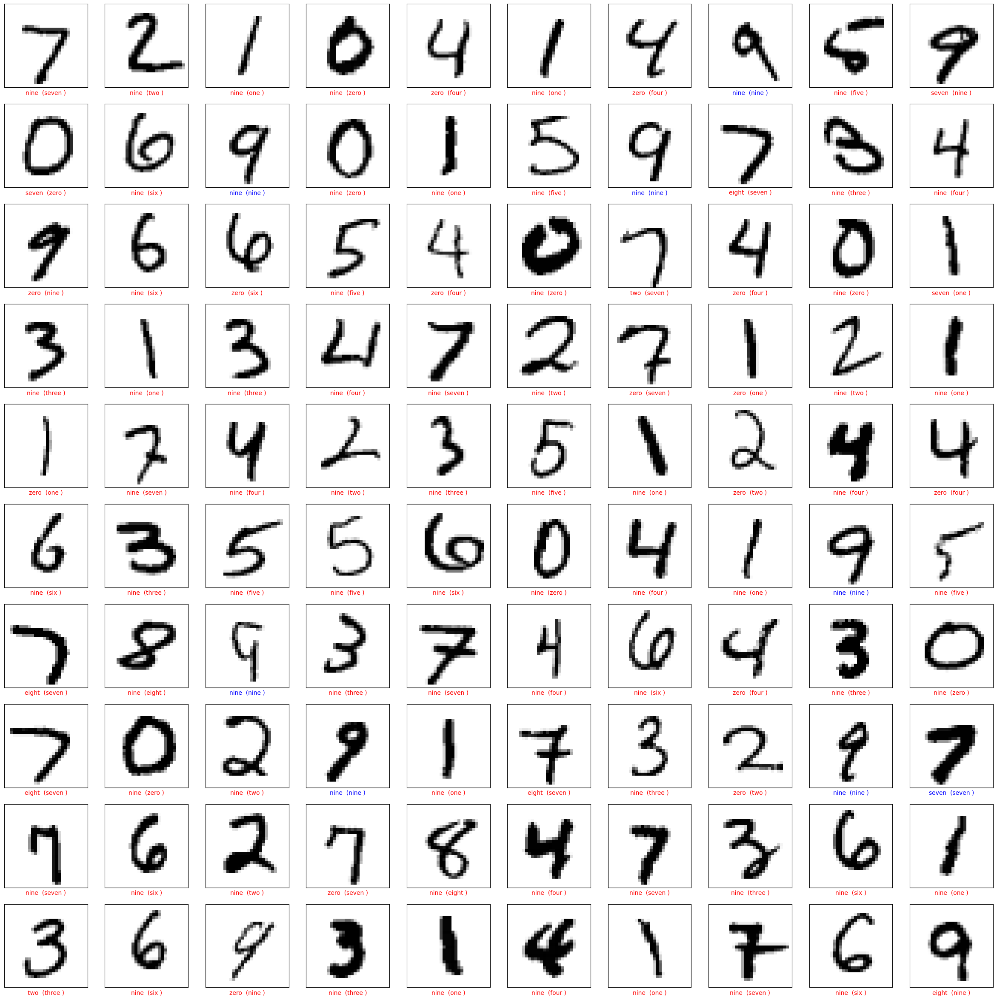

In [6]:
mnist_visual_test(mnist_ff, test_images, test_labels)

### Let us train the MLP to classify the digits

In [7]:
mnist_ff.fit(train_images, train_labels, epochs=7)

Epoch 1/7
1875/1875 [==============================] - 15s 8ms/step - loss: 0.4741 - accuracy: 0.8652
Epoch 2/7
1875/1875 [==============================] - 14s 8ms/step - loss: 0.2491 - accuracy: 0.9284
Epoch 3/7
1875/1875 [==============================] - 15s 8ms/step - loss: 0.2140 - accuracy: 0.9383
Epoch 4/7
1875/1875 [==============================] - 15s 8ms/step - loss: 0.1961 - accuracy: 0.9444
Epoch 5/7
1875/1875 [==============================] - 15s 8ms/step - loss: 0.1832 - accuracy: 0.9479
Epoch 6/7
1875/1875 [==============================] - 15s 8ms/step - loss: 0.1755 - accuracy: 0.9508
Epoch 7/7
1875/1875 [==============================] - 15s 8ms/step - loss: 0.1687 - accuracy: 0.9522


### Let us check how the network performs by plotting some images and their labels

13/13 [==============================] - 0s 4ms/step


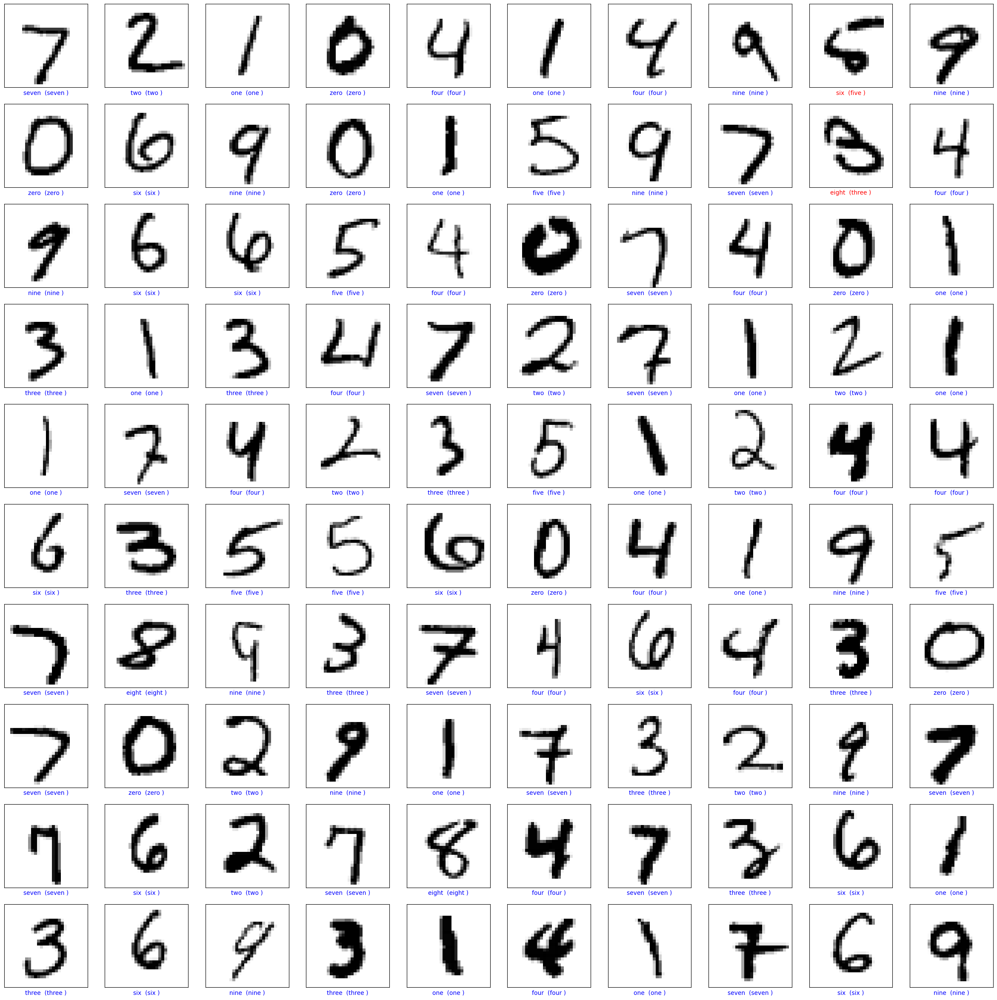

In [8]:
mnist_visual_test(mnist_ff, test_images, test_labels)

### Let us plot the confusion matrix

1250/1250 [==============================] - 3s 2ms/step


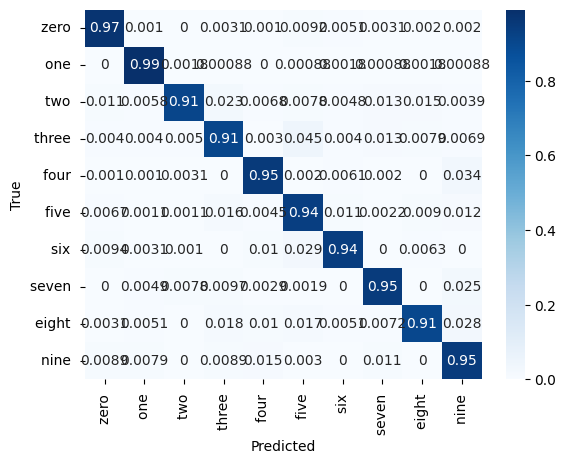

In [9]:
mnist_confusion_matrix(mnist_ff, test_images, test_labels)

## Convolutional Neural Networks

Let us define a simple CNN to classify hand written digits

In [10]:
inputs = Input(shape=(28, 28, 1))
x = Rescaling(1/255)(inputs)

#--------------------------------------------- Feature extractor -----------------------------

# first convolutional block
x = Conv2D(filters=32, kernel_size=3, activation="relu", name='block_1_conv')(x)
x = MaxPooling2D(pool_size=2, name='block_1_pool')(x)

# second convolutional block
x = Conv2D(filters=64, kernel_size=3, activation="relu", name='block_2_conv')(x)
x = MaxPooling2D(pool_size=2, name='block_2_pool')(x)

#---------------------------------------------- Dense classifier -----------------------------
x = Flatten()(x)
x = Dense(units=256, activation='relu', name='fc1')(x)
x = Dense(units=256, activation='relu', name='fc2')(x)
outputs = Dense(10, activation="softmax")(x)

mnist_cnn = Model(inputs=inputs, outputs=outputs)
mnist_cnn.compile(loss="sparse_categorical_crossentropy", metrics=["accuracy"])
mnist_cnn.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 28, 28, 1)]       0         
                                                                 
 rescaling_1 (Rescaling)     (None, 28, 28, 1)         0         
                                                                 
 block_1_conv (Conv2D)       (None, 26, 26, 32)        320       
                                                                 
 block_1_pool (MaxPooling2D)  (None, 13, 13, 32)       0         
                                                                 
 block_2_conv (Conv2D)       (None, 11, 11, 64)        18496     
                                                                 
 block_2_pool (MaxPooling2D)  (None, 5, 5, 64)         0         
                                                                 
 flatten_1 (Flatten)         (None, 1600)              0   

### Let us train the defined neural network

In [11]:
mnist_cnn.fit(train_images, train_labels, epochs=5)

Epoch 1/5
1875/1875 [==============================] - 38s 17ms/step - loss: 0.1188 - accuracy: 0.9632
Epoch 2/5
1875/1875 [==============================] - 32s 17ms/step - loss: 0.0433 - accuracy: 0.9870
Epoch 3/5
1875/1875 [==============================] - 32s 17ms/step - loss: 0.0343 - accuracy: 0.9906
Epoch 4/5
1875/1875 [==============================] - 32s 17ms/step - loss: 0.0313 - accuracy: 0.9916
Epoch 5/5
1875/1875 [==============================] - 32s 17ms/step - loss: 0.0299 - accuracy: 0.9925


### Let us view the performance of the network on some of the images

13/13 [==============================] - 1s 11ms/step


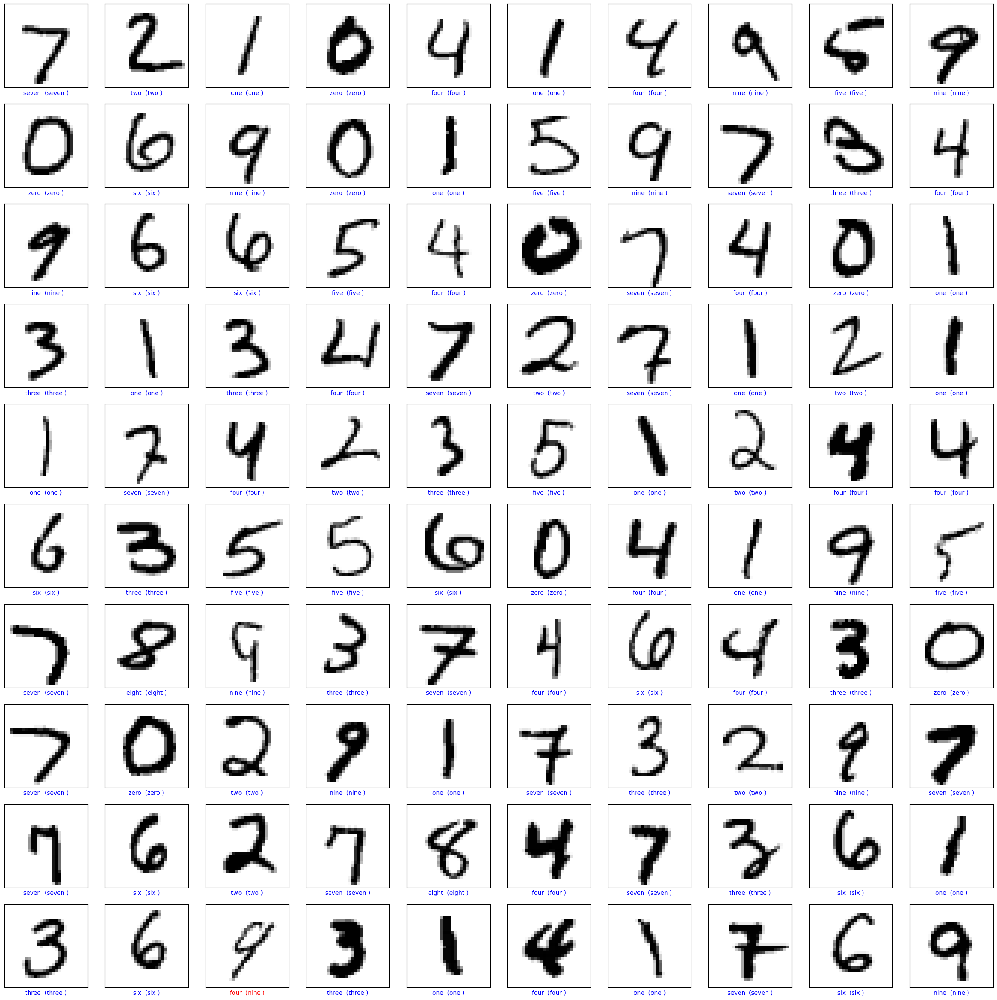

In [12]:
mnist_visual_test(mnist_cnn, test_images, test_labels)

### Generate the Confusion Matrix for the model's performance

1250/1250 [==============================] - 3s 3ms/step


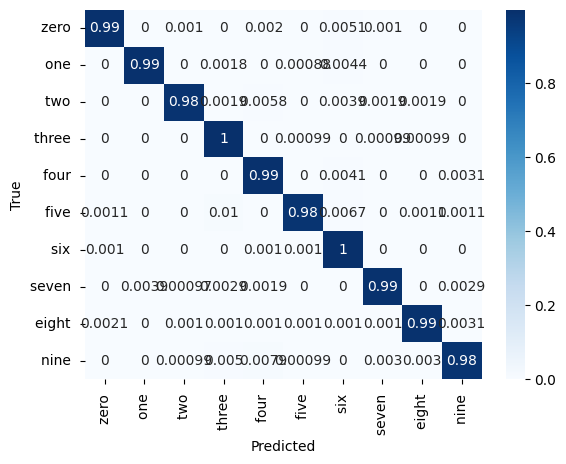

In [14]:
mnist_confusion_matrix(mnist_cnn, test_images, test_labels)

# Fruit Classification 

## In this section, we load our training and testing data
The images will be reshaped to 180 pixels in width and 180 pixels in height <br>
We shall be reading 8 images at a time. This is because our GPU has little memory

In [15]:
from tensorflow.keras.utils import image_dataset_from_directory
train_dataset = image_dataset_from_directory("set/train", image_size=(180, 180), batch_size=8)
test_dataset = image_dataset_from_directory("set/test", image_size=(180, 180), batch_size=8)

Found 9425 files belonging to 6 classes.
Found 2698 files belonging to 6 classes.


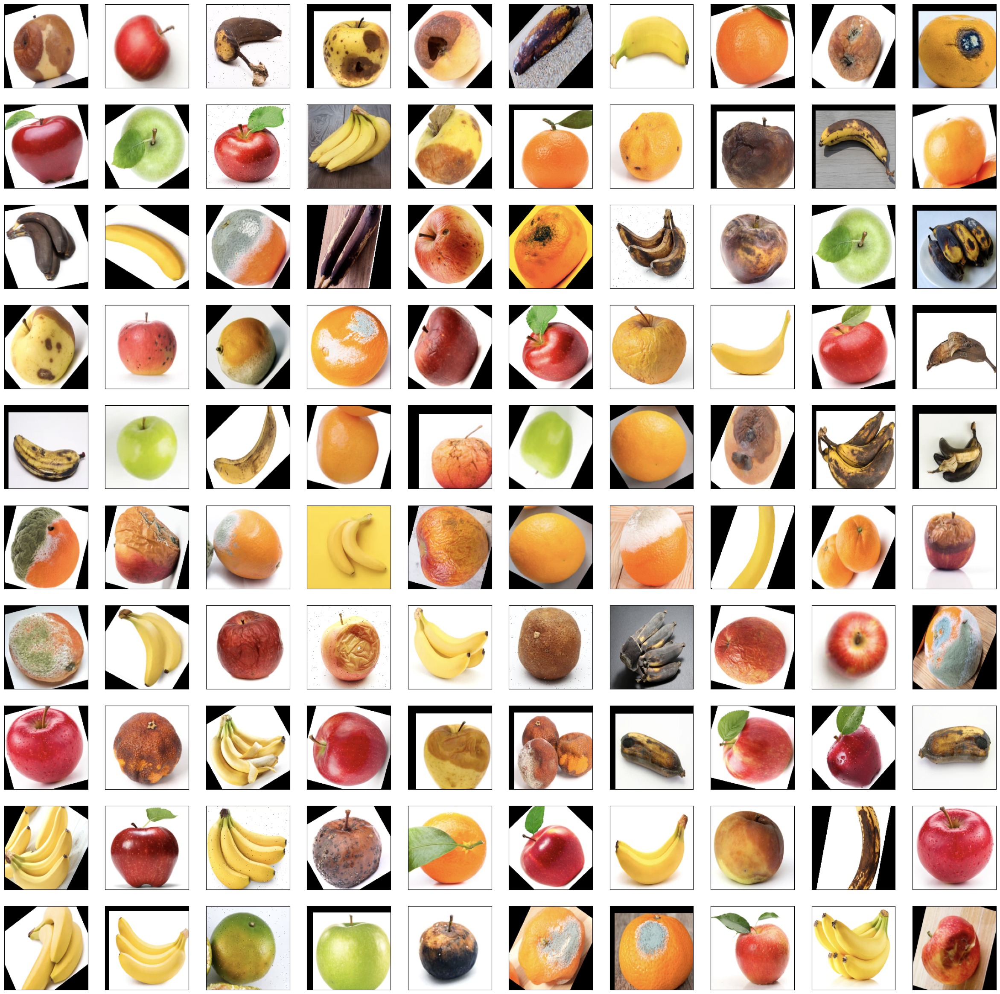

In [16]:
plot_fruit_images()

### In this section, we define the architecture of our neural network

In [18]:
inputs = Input(shape=(180, 180, 3))
x = Rescaling(1/255)(inputs)

#--------------------------------------------- Feature extractor -----------------------------

# first convolutional block
x = Conv2D(filters=16, kernel_size=3, activation="relu", name='block_1_conv')(x)
x = MaxPooling2D(pool_size=2, name='block_1_pool')(x)

# second convolutional block
x = Conv2D(filters=32, kernel_size=3, activation="relu", name='block_2_conv')(x)
x = MaxPooling2D(pool_size=2, name='block_2_pool')(x)

# third convolutional block
x = Conv2D(filters=64, kernel_size=3, activation="relu", name='block_3_conv')(x)
x = MaxPooling2D(pool_size=2, name='block_3_pool')(x)

# fourth convolutional block
x = Conv2D(filters=132, kernel_size=3, activation="relu", name='block_4_conv')(x)
x = MaxPooling2D(pool_size=2, name='block_4_pool')(x)

# fifth convolutional block
x = Conv2D(filters=256, kernel_size=3, activation="relu", name='block_5_conv')(x)
x = MaxPooling2D(pool_size=2, name='block_5_pool')(x)

#---------------------------------------------- Dense classifier -----------------------------
x = Flatten()(x)
x = Dense(units=256, activation='relu', name='fc1')(x)
x = Dense(units=256, activation='relu', name='fc2')(x)
outputs = Dense(6, activation="softmax")(x)

model = Model(inputs=inputs, outputs=outputs)
model.compile(loss="sparse_categorical_crossentropy", metrics=["accuracy"])
model.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 180, 180, 3)]     0         
                                                                 
 rescaling_3 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 block_1_conv (Conv2D)       (None, 178, 178, 16)      448       
                                                                 
 block_1_pool (MaxPooling2D)  (None, 89, 89, 16)       0         
                                                                 
 block_2_conv (Conv2D)       (None, 87, 87, 32)        4640      
                                                                 
 block_2_pool (MaxPooling2D)  (None, 43, 43, 32)       0         
                                                                 
 block_3_conv (Conv2D)       (None, 41, 41, 64)        1849

### Graphical Representation of our architecture

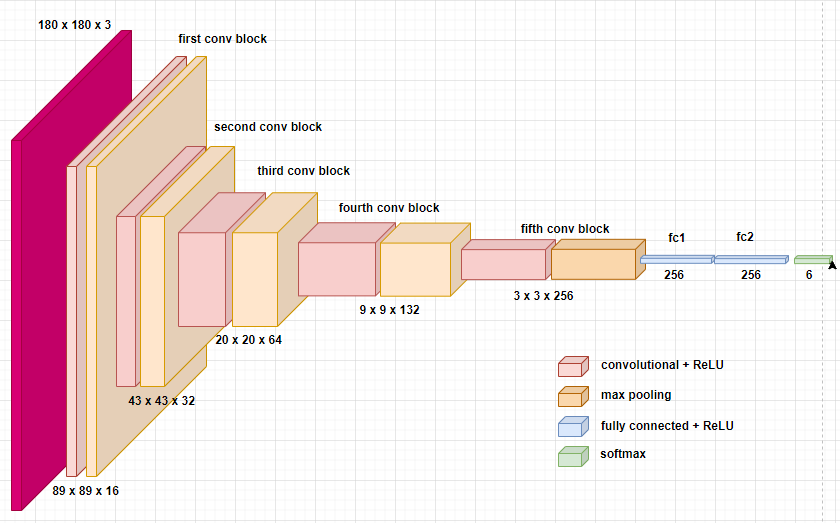

### What is a convolution

<video width="700" height="600" 
       src="conv.mp4"  
       controls>
</video>

## Model Analysis before training

### Let us see our untrained network performs on our test data before training

338/338 [==============================] - 12s 33ms/step


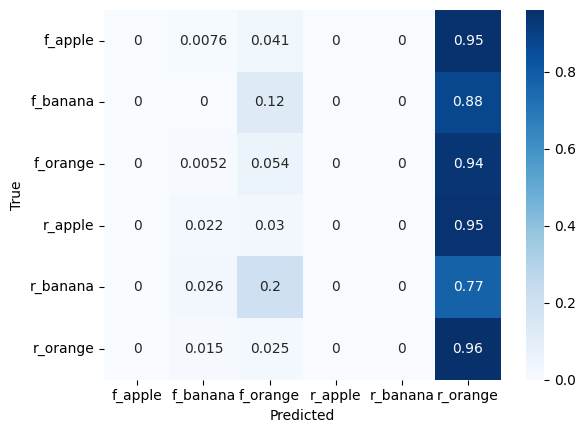

In [19]:
show_confusion_matrix(model)

### Let us print some of the test images and see how the network performs before training

13/13 [==============================] - 1s 81ms/step


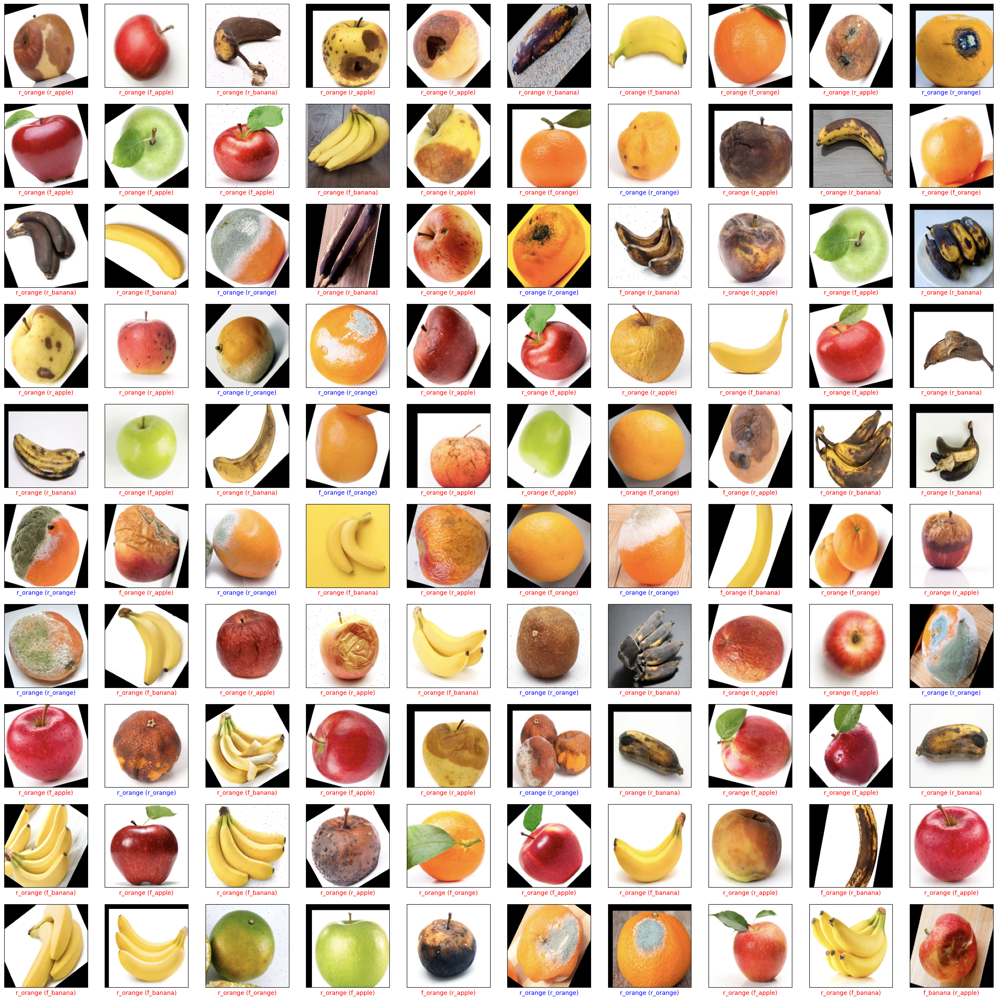

In [20]:
show_samples(model)

### In this section, we are going to train our defined machine learning model

In [ ]:
history = model.fit(train_dataset,epochs=7)

Epoch 1/7
1179/1179 [==============================] - 102s 85ms/step - loss: 0.7764 - accuracy: 0.7301
Epoch 2/7
1179/1179 [==============================] - 103s 87ms/step - loss: 0.4512 - accuracy: 0.8654
Epoch 3/7
1179/1179 [==============================] - 102s 87ms/step - loss: 0.4381 - accuracy: 0.8848
Epoch 4/7
1179/1179 [==============================] - 104s 88ms/step - loss: 0.4523 - accuracy: 0.8848
Epoch 5/7
 215/1179 [====>.........................] - ETA: 1:26 - loss: 0.5313 - accuracy: 0.8953

### In this section we evaluate our network to see how it works on unseen data

In [ ]:
model.evaluate(test_dataset)

<iframe width="560" height="315" src="https://www.youtube.com/embed/JboZfxUjLSk?clip=Ugkx_wpAwDU0yEpmPKeex47mu3P7lHUU8Tch&amp;clipt=EM7YAxjmzQQ" title="YouTube video player" frameborder="0" allow="accelerometer; autoplay; clipboard-write; encrypted-media; gyroscope; picture-in-picture; web-share" allowfullscreen></iframe>

<iframe width="560" height="315" src="https://www.youtube.com/embed/JboZfxUjLSk?clip=Ugkx_wpAwDU0yEpmPKeex47mu3P7lHUU8Tch&amp;clipt=EM7YAxjmzQQ" title="YouTube video player" frameborder="0" allow="accelerometer; autoplay; clipboard-write; encrypted-media; gyroscope; picture-in-picture; web-share" allowfullscreen></iframe>

### here we shall plot the confusion matrix of our test set

In [ ]:
show_confusion_matrix(model)

### Let us print some of the test images and see how the network performs

In [ ]:
show_samples(model)

In [ ]:
model.save('model.keras')

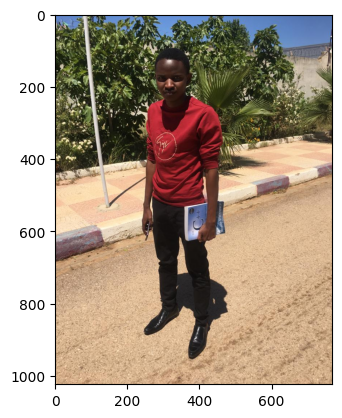

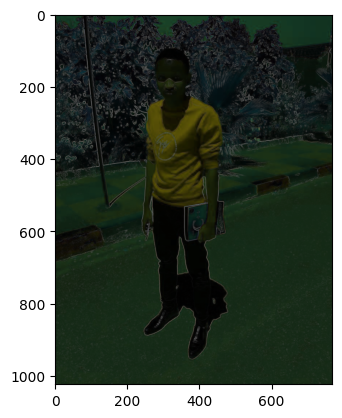

In [10]:
from skimage import data, io, filters

from PIL import Image

img = Image.open('kasozi.jpg')
plt.imshow(img)
plt.show()
pixels = np.asarray(img)
edges = filters.sobel(pixels)
plt.imshow(edges)
plt.show()